<a href="https://colab.research.google.com/github/Ramyadeepthid/ImageDetection_IIITH_Group36/blob/detection_script/SoftIOU_and_EM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ultralytics opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.7 MB/s eta 0:00:00


In [2]:
!nvidia-smi

Sat Dec 13 09:54:42 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   67C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from ultralytics import YOLO
import shutil
import os

# Define the dataset directory
dataset_dir = "/content/datasets"

# Remove the directory if it exists to ensure a fresh download
if os.path.exists(dataset_dir):
    shutil.rmtree(dataset_dir)
    print(f"Removed existing dataset directory: {dataset_dir}")

# Load YOLOv10n model from scratch
model = YOLO("yolo11n.pt")

# Train the model
results=model.train(data="SKU-110K.yaml", epochs=8, imgsz=640,batch=8)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=SKU-110K.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=8, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, l

In [81]:
#to Create Train/Val/Test Split
images_folder_path = "/content/SKU110K_fixed/images/"
annotation_path={"test": "/content/SKU110K_fixed/annotations/annotations_test.csv",
            "train":"/content/SKU110K_fixed/annotations/annotations_train.csv",
            "val":"/content/SKU110K_fixed/annotations/annotations_val.csv",
                 }
csv_cols = "image_name,x1,y1,x2,y2,class,image_width,image_height"
csv_cols_list = csv_cols.split(sep=',')
csv_cols_list

['image_name', 'x1', 'y1', 'x2', 'y2', 'class', 'image_width', 'image_height']

Detected products: 125
Shelf rows detected: 40
Gaps found: 31
Saved: /content/output_with_gaps.png


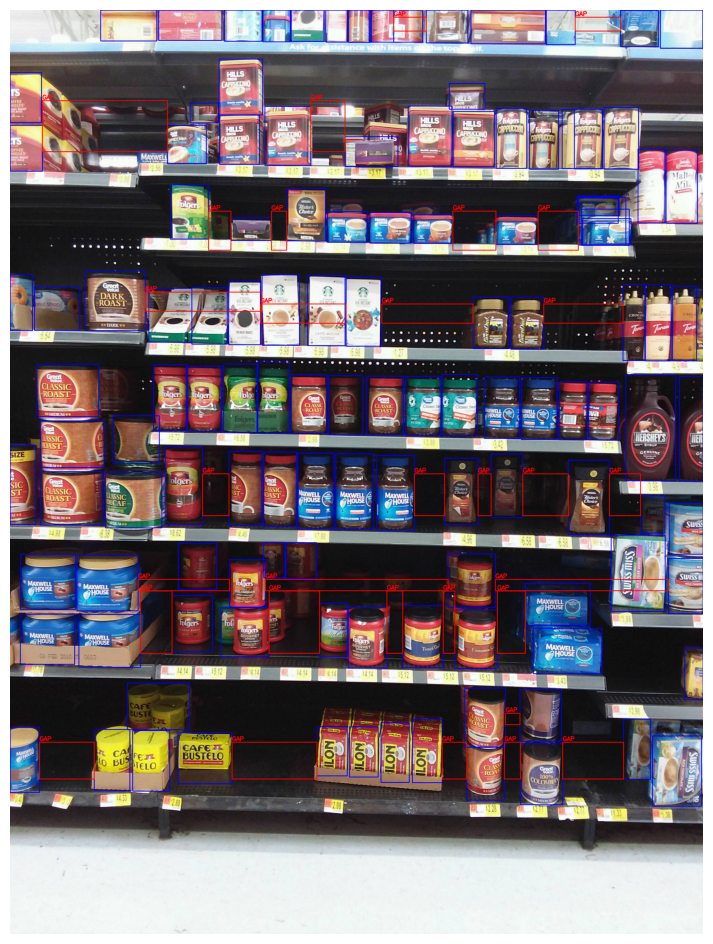

In [82]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# -----------------------------------------------------------
# 1. LOAD IMAGE
# -----------------------------------------------------------
image_path = "/content/datasets/SKU-110K/images/test_9.jpg"
image = cv2.imread(image_path)

if image is None:
    raise ValueError("Image not found!")

h, w = image.shape[:2]


# -----------------------------------------------------------
# 2. YOLO DETECTIONS (your existing result object)
# -----------------------------------------------------------
# YOLO format is already xyxy
boxes = result.boxes.xyxy.cpu().numpy().astype(int).tolist()
print("Detected products:", len(boxes))


# -----------------------------------------------------------
# 3. DETECT SHELF ROWS USING HORIZONTAL EDGE PROJECTION
# -----------------------------------------------------------
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 80, 180)

# Horizontal projection of edges
proj = np.sum(edges, axis=1)
th = np.mean(proj) * 1.5

shelf_lines = np.where(proj > th)[0]

# Group continuous lines into shelf levels
rows = []
current = [shelf_lines[0]]

for y in shelf_lines[1:]:
    if y - current[-1] <= 10:
        current.append(y)
    else:
        rows.append((min(current), max(current)))
        current = [y]

rows.append((min(current), max(current)))

# Convert to vertical shelf bands
shelf_rows = []
for top, bottom in rows:
    shelf_rows.append([max(top - 20, 0), min(bottom + 20, h)])

print("Shelf rows detected:", len(shelf_rows))


# -----------------------------------------------------------
# 4. ASSIGN EACH PRODUCT BOX TO A SHELF
# -----------------------------------------------------------
def assign_to_rows(boxes, shelf_rows):
    row_map = {i: [] for i in range(len(shelf_rows))}

    for b in boxes:
        x1, y1, x2, y2 = b
        cy = (y1 + y2) // 2

        for i, (top, bottom) in enumerate(shelf_rows):
            if top <= cy <= bottom:
                row_map[i].append(b)
                break

    return row_map


row_boxes = assign_to_rows(boxes, shelf_rows)


# -----------------------------------------------------------
# 5. FIND GAPS INSIDE EACH SHELF
# -----------------------------------------------------------
gap_boxes = []

for rid, rboxes in row_boxes.items():

    if len(rboxes) < 2:
        continue

    # Sort products from left → right
    rboxes = sorted(rboxes, key=lambda b: b[0])

    for i in range(len(rboxes) - 1):
        x1 = rboxes[i][2]      # right side of left product
        x2 = rboxes[i+1][0]    # left side of next product

        gap_width = x2 - x1

        if gap_width > 40:  # tune this threshold
            y_top, y_bot = shelf_rows[rid]
            gap_boxes.append([x1, y_top, x2, y_bot])

print("Gaps found:", len(gap_boxes))


# -----------------------------------------------------------
# 6. DRAW RESULTS
# -----------------------------------------------------------
output = image.copy()

# BLUE = product boxes
for (x1, y1, x2, y2) in boxes:
    cv2.rectangle(output, (x1, y1), (x2, y2), (255, 0, 0), 2)

# RED = gap boxes
for (x1, y1, x2, y2) in gap_boxes:
    cv2.rectangle(output, (x1, y1), (x2, y2), (0, 0, 255), 2)
    cv2.putText(output, "GAP", (x1, y1 - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)


# -----------------------------------------------------------
# 7. SAVE + SHOW OUTPUT
# -----------------------------------------------------------
out_path = "/content/output_with_gaps.png"
cv2.imwrite(out_path, output)
print("Saved:", out_path)

plt.figure(figsize=(12, 12))
plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


In [85]:
import torch
from ultralytics import YOLO
from PIL import Image
import torchvision.transforms as T
import timm
import os

# ============================
# 3. Load YOLOv11 detection model
# ============================
# Ensure this path matches where your YOLO model was saved in the previous step
yolo_model = YOLO("/content/runs/detect/train/weights/best.pt")

# ============================
# 4. Load classifier model (EfficientNet)
# ============================
# Using a pre-trained EfficientNet-B0 model for classification
classifier = timm.create_model('efficientnet_b0', pretrained=True)
classifier.eval() # Set the model to evaluation mode

# ImageNet normalization transforms for the classifier
transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225])
])

# ============================
# 5. Set image path for inference
# ============================
# Using an image path from the previous YOLO training output for demonstration
image_path = "/content/runs/detect/train/train_batch0.jpg"


# ============================
# 6. Run YOLO detection
# ============================
# Set verbose to False to suppress redundant output during prediction
results = yolo_model(image_path, verbose=False)

# Open the original image for cropping detected objects
image = Image.open(image_path).convert("RGB")

final_detections = []

# ============================
# 7. Crop each detected box and classify it
# ============================
if results:
    for r in results:
        boxes = r.boxes.xyxy.cpu().numpy()
        det_conf = r.boxes.conf.cpu().numpy()

        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = map(int, box)
            # Ensure coordinates are within image bounds
            x1 = max(0, x1)
            y1 = max(0, y1)
            x2 = min(image.width, x2)
            y2 = min(image.height, y2)

            # Crop the detected object
            crop = image.crop((x1, y1, x2, y2))

            # Preprocess the cropped image for the classifier
            input_tensor = transform(crop).unsqueeze(0)

            # Classify the cropped object using EfficientNet
            with torch.no_grad():
                preds = classifier(input_tensor)
                class_id = preds.argmax(dim=1).item()
                class_conf = torch.softmax(preds, dim=1)[0, class_id].item()

            final_detections.append({
                "bbox": (x1, y1, x2, y2),
                "det_conf": float(det_conf[i]),
                "class_id": int(class_id),
                "class_conf": float(class_conf)
            })

# ============================
# 8. Print classification results
# ============================
if final_detections:
    print("\n--- Detection and Classification Results ---")
    for det in final_detections:
        print(
            f"Box: {det['bbox']}, "
            f"YOLO Conf: {det['det_conf']:.2f}, "
            f"Class ID: {det['class_id']}, "
            f"Class Conf: {det['class_conf']:.2f}"
        )
else:
    print("No objects detected for classification.")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]


--- Detection and Classification Results ---
Box: (919, 1832, 949, 1911), YOLO Conf: 0.53, Class ID: 772, Class Conf: 0.09
Box: (804, 1832, 832, 1914), YOLO Conf: 0.50, Class ID: 631, Class Conf: 0.16
Box: (773, 1831, 803, 1910), YOLO Conf: 0.49, Class ID: 631, Class Conf: 0.13
Box: (746, 1832, 772, 1911), YOLO Conf: 0.49, Class ID: 631, Class Conf: 0.09
Box: (889, 1833, 918, 1913), YOLO Conf: 0.48, Class ID: 921, Class Conf: 0.06
Box: (865, 1657, 891, 1741), YOLO Conf: 0.47, Class ID: 772, Class Conf: 0.37
Box: (892, 1656, 919, 1741), YOLO Conf: 0.45, Class ID: 686, Class Conf: 0.11
Box: (719, 1832, 744, 1912), YOLO Conf: 0.44, Class ID: 686, Class Conf: 0.37
Box: (862, 1832, 888, 1908), YOLO Conf: 0.43, Class ID: 631, Class Conf: 0.21
Box: (951, 1833, 977, 1909), YOLO Conf: 0.42, Class ID: 838, Class Conf: 0.25
Box: (836, 1831, 860, 1908), YOLO Conf: 0.42, Class ID: 838, Class Conf: 0.08
Box: (1011, 1668, 1043, 1735), YOLO Conf: 0.40, Class ID: 838, Class Conf: 0.16
Box: (1106, 1898

In [86]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import gc
from typing import List, Tuple, Union

# ---------------------------
# Helper utilities
# ---------------------------
def load_image_low_ram(path_or_img: Union[str, np.ndarray], max_size: int = 1400):
    """
    Accept either a path or an already-loaded image (BGR).
    Resizes so the largest side is max_size (keeps aspect ratio).
    """
    if isinstance(path_or_img, str):
        img = cv2.imread(path_or_img)
        if img is None:
            raise ValueError(f"Could not load image from path: {path_or_img}")
    else:
        img = path_or_img.copy()

    h, w = img.shape[:2]
    scale = 1.0
    if max(h, w) > max_size:
        scale = max_size / max(h, w)
        img = cv2.resize(img, (int(w * scale), int(h * scale)), interpolation=cv2.INTER_AREA)
    return img, scale

def iou(boxA, boxB):
    # boxes: (x,y,w,h)
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[0] + boxA[2], boxB[0] + boxB[2])
    yB = min(boxA[1] + boxA[3], boxB[1] + boxB[3])
    interW = max(0, xB - xA)
    interH = max(0, yB - yA)
    inter = interW * interH
    areaA = boxA[2] * boxA[3]
    areaB = boxB[2] * boxB[3]
    union = areaA + areaB - inter
    return 0 if union == 0 else inter / union

def nms_boxes(boxes: List[Tuple[int,int,int,int]], iou_thresh: float = 0.4):
    """Simple NMS (keep larger-area boxes first)."""
    if not boxes:
        return []
    boxes_arr = np.array(boxes)
    areas = boxes_arr[:,2] * boxes_arr[:,3]
    order = areas.argsort()[::-1]
    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(tuple(boxes_arr[i].astype(int)))
        rest = order[1:]
        keep_mask = []
        for j in rest:
            if iou(tuple(boxes_arr[i]), tuple(boxes_arr[j])) < iou_thresh:
                keep_mask.append(j)
        order = np.array(keep_mask)
    return keep

# ---------------------------
# RAM-safe ShelfGapDetector
# ---------------------------
class ShelfGapDetectorRAMSafe:
    def __init__(
        self,
        min_gap_width: int = 40,
        min_gap_height: int = 40,
        max_image_size: int = 1400,
        row_min_height: int = 30,
        projection_smooth: int = 9
    ):
        """
        min_gap_width/min_gap_height: filters for final gaps (pixels in resized image)
        max_image_size: largest side of image after resizing (keeps RAM down)
        row_min_height: minimum height for a shelf row
        projection_smooth: kernel size for smoothing projection profile
        """
        self.min_gap_width = min_gap_width
        self.min_gap_height = min_gap_height
        self.max_image_size = max_image_size
        self.row_min_height = row_min_height
        self.projection_smooth = projection_smooth

    # ---------------------------
    # Preprocessing: cheap & small-memory
    # ---------------------------
    def preprocess(self, img: np.ndarray) -> np.ndarray:
        """
        More robust mask: combine adaptive threshold + edge map (Canny) + morphological ops.
        The idea: edges show product boundaries even when the interior is low-contrast.
        """
        # grayscale + CLAHE to normalize lighting
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        gray_clahe = clahe.apply(gray)

        # gentle blur
        blur = cv2.GaussianBlur(gray_clahe, (5,5), 0)

        # adaptive threshold (inverse so objects are white)
        th = cv2.adaptiveThreshold(blur, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 21, 9)

        # edge map (Canny) tuned for shelf edges (lower thresholds)
        v = np.median(blur)
        lower = int(max(10, 0.66 * v))
        upper = int(min(255, 1.33 * v))
        edges = cv2.Canny(blur, lower, upper)

        # dilate edges horizontally to connect vertical gaps inside products
        ker_h = cv2.getStructuringElement(cv2.MORPH_RECT, (7,1))
        ker_v = cv2.getStructuringElement(cv2.MORPH_RECT, (1,7))
        edges_d = cv2.dilate(edges, ker_v, iterations=1)

        # combine threshold + edges: either a filled product region or strong edge -> product
        combined = cv2.bitwise_or(th, edges_d)

        # close horizontally to join face regions, then open to remove tiny specks
        kernel_close = cv2.getStructuringElement(cv2.MORPH_RECT, (9,3))
        kernel_open = cv2.getStructuringElement(cv2.MORPH_RECT, (3,9))
        combined = cv2.morphologyEx(combined, cv2.MORPH_CLOSE, kernel_close, iterations=1)
        combined = cv2.morphologyEx(combined, cv2.MORPH_OPEN, kernel_open, iterations=1)

        # final small median to remove pepper noise
        combined = cv2.medianBlur(combined, 3)
        return combined


    # ---------------------------
    # Row detection using horizontal projection (very cheap)
    # ---------------------------
    def detect_rows(self, binary_mask: np.ndarray) -> List[Tuple[int,int,int,int]]:
        """
        Detect shelf rows using horizontal projection of edges/content.
        Using edges reduces false positive 'content' caused by small bright patches.
        """
        h, w = binary_mask.shape[:2]

        # horizontal projection
        horiz_proj = np.sum(binary_mask > 0, axis=1).astype(np.float32)

        # smooth with gaussian to reduce tiny peaks
        k = max(3, (self.projection_smooth // 2) | 1)
        horiz_proj_s = cv2.GaussianBlur(horiz_proj.reshape(-1,1), (k,1), 0).ravel()

        # compute local maxima envelope using dilation (gives neighborhood max)
        win = max(15, int(h * 0.02))  # neighborhood ~2% of image height, at least 15
        kernel = np.ones((win,1), np.uint8)
        # to use cv2.dilate we need an image; create column image then dilate vertically
        proj_img = (horiz_proj_s.reshape(-1,1)).astype(np.float32)
        # convert to uint8 range for morphology ops: scale to 0-255
        normalized = ((proj_img - proj_img.min()) / (proj_img.ptp() + 1e-6) * 255).astype(np.uint8)
        dilated = cv2.dilate(normalized, kernel, iterations=1).ravel().astype(np.float32)

        # threshold as fraction of local maxima (so tall shelves and low-contrast shelves both work)
        mask_rows = (normalized >= (dilated * 0.18)).astype(np.uint8)  # columns near local maxima

        # find continuous regions as candidate rows
        rows = []
        start = None
        for i, v in enumerate(mask_rows):
            if v and start is None:
                start = i
            if not v and start is not None:
                end = i
                if (end - start) >= self.row_min_height:
                    rows.append((0, start, w, end - start))
                start = None
        if start is not None:
            end = len(mask_rows)
            if (end - start) >= self.row_min_height:
                rows.append((0, start, w, end - start))

        # If rows look too many or too few, attempt a fallback using a lower threshold
        if len(rows) == 0:
            # fallback: simple threshold on smoothed projection
            fallback_mask = (horiz_proj_s >= max(3, horiz_proj_s.max() * 0.03)).astype(np.uint8)
            start = None
            for i, v in enumerate(fallback_mask):
                if v and start is None:
                    start = i
                if not v and start is not None:
                    end = i
                    if (end - start) >= self.row_min_height:
                        rows.append((0, start, w, end - start))
                    start = None
            if start is not None:
                end = len(fallback_mask)
                if (end - start) >= self.row_min_height:
                    rows.append((0, start, w, end - start))

        # merge rows that are too close (small separators come from small noise)
        merged = []
        for r in rows:
            if not merged:
                merged.append(list(r))
            else:
                prev = merged[-1]
                # if gap between rows < row_min_height // 2, merge them
                if r[1] - (prev[1] + prev[3]) < (self.row_min_height // 2):
                    prev[3] = (r[1] + r[3]) - prev[1]
                else:
                    merged.append(list(r))
        rows = [tuple(m) for m in merged]
        return rows

    def detect_gaps_in_row(self, row_mask: np.ndarray, row_bbox: Tuple[int,int,int,int]) -> List[Tuple[int,int,int,int]]:
        """
        Improved gap detection: use relative valleys (local minima) in the vertical projection.
        This is more robust than an absolute threshold: it finds columns that are significantly
        lower than their local neighborhood.
        """
        x, y, w, h = row_bbox
        crop = row_mask[y:y+h, x:x+w]

        # vertical projection: count of product/edge pixels per column
        vert_proj = np.sum(crop > 0, axis=0).astype(np.float32)

        # smooth projection (1D gaussian via cv2)
        k = max(3, (self.projection_smooth // 2) | 1)
        vert_proj_s = cv2.GaussianBlur(vert_proj.reshape(1,-1), (1,k), 0).ravel()

        # compute local max envelope using dilation on a 1xwindow image
        win = max(25, int(w * 0.03))  # neighborhood width ~3% of row width, min 25
        proj_img = (vert_proj_s.reshape(1,-1)).astype(np.float32)
        # normalize to 0-255 for morphology
        normalized = ((proj_img - proj_img.min()) / (proj_img.ptp() + 1e-6) * 255).astype(np.uint8)
        kernel = np.ones((1, win), np.uint8)
        local_max = cv2.dilate(normalized, kernel, iterations=1).ravel().astype(np.float32)

        # find columns that are significantly lower than their local maxima -> valley
        # threshold fraction: a column is "empty-like" if it's <= local_max * valley_frac
        valley_frac = 0.18  # tuned: 18% of local max considered valley (adjustable)
        empty_cols = (normalized <= (local_max * valley_frac)).astype(np.uint8)

        # remove tiny specks via morphological open on the 1D mask
        empty_cols_img = empty_cols.reshape(1,-1).astype(np.uint8)
        kernel_small = np.ones((1, max(3, win//10)), np.uint8)
        empty_cols_clean = cv2.morphologyEx(empty_cols_img, cv2.MORPH_OPEN, kernel_small, iterations=1).ravel()

        # find contiguous empty segments
        gaps = []
        start = None
        for i, v in enumerate(empty_cols_clean):
            if v and start is None:
                start = i
            if not v and start is not None:
                end = i
                width = end - start
                # require gap width relative to row width or absolute minimum
                if width >= max(self.min_gap_width, int(0.03 * w)):
                    gap_x = x + start
                    gap_w = width
                    # For height, attempt to detect vertical clearance: find rows with any content in the columns at edges
                    col_slice = crop[:, max(0, start-2):min(w, end+2)]
                    if np.count_nonzero(col_slice) == 0:
                        gap_y = y
                        gap_h = h
                    else:
                        # find topmost and bottommost rows that have content in neighboring columns
                        rows_indices = np.where(np.sum(col_slice, axis=1) > 0)[0]
                        if rows_indices.size == 0:
                            gap_y = y
                            gap_h = h
                        else:
                            # expand a little to be conservative
                            top_rel = max(0, rows_indices.min() - 2)
                            bot_rel = min(h-1, rows_indices.max() + 2)
                            gap_y = y + top_rel
                            gap_h = max(self.min_gap_height, bot_rel - top_rel + 1)
                    gaps.append((int(gap_x), int(gap_y), int(gap_w), int(gap_h)))
                start = None
        # tail
        if start is not None:
            end = len(empty_cols_clean)
            width = end - start
            if width >= max(self.min_gap_width, int(0.03 * w)):
                gap_x = x + start
                gap_w = width
                gap_y = y
                gap_h = h
                gaps.append((int(gap_x), int(gap_y), int(gap_w), int(gap_h)))
        return gaps

    # ---------------------------
    # Public API
    # ---------------------------
    def detect_missing_objects(self, path_or_img: Union[str, np.ndarray]):
        """
        Run full pipeline and return (resized_image, gaps)
        gaps: list of (x,y,w,h) in resized image coordinates
        """
        # 1) load & resize
        img, scale = load_image_low_ram(path_or_img, max_size=self.max_image_size)

        # 2) preprocess -> binary mask (products white)
        mask = self.preprocess(img)

        # 3) detect shelf rows
        rows = self.detect_rows(mask)

        # 4) detect gaps per row
        all_gaps = []
        for row_bbox in rows:
            gaps = self.detect_gaps_in_row(mask, row_bbox)
            # filter by min_gap_height too
            for (gx, gy, gw, gh) in gaps:
                if gw >= self.min_gap_width and gh >= self.min_gap_height:
                    all_gaps.append((gx, gy, gw, gh))

        # 5) NMS
        final_gaps = nms_boxes(all_gaps, iou_thresh=0.35)

        # cleanup
        del mask
        gc.collect()

        return img, final_gaps

    def visualize_results(self, image, gaps, save_path=None):
        img = image.copy()

        # Draw red boxes
        for (x, y, w, h) in gaps:
            cv2.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), 4)

        # Save if needed
        if save_path:
            cv2.imwrite(save_path, img)

        # Always show via matplotlib (never blanks)
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Detected Gaps: {len(gaps)}")
        plt.axis("off")
        plt.show()

        return img

# ---------------------------
# Helper: extract boxes from mask using connected components
# ---------------------------
def boxes_from_mask_cc(mask: np.ndarray, min_area: int = 400):
    """
    Find connected components in the binary mask and return boxes in (x,y,w,h).
    min_area helps filter tiny specks. mask expected as 0/255 uint8.
    """
    # ensure binary
    bin_mask = (mask > 0).astype('uint8') * 255
    # find connected components (cv2.connectedComponentsWithStats is memory cheap)
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(bin_mask, connectivity=8)
    boxes = []
    for i in range(1, num_labels):
        x, y, w, h, area = stats[i]
        if area >= min_area and w >= 8 and h >= 8:
            boxes.append((int(x), int(y), int(w), int(h)))
    return boxes

# ---------------------------
# Row clustering (improved)
# ---------------------------
def cluster_rows_from_boxes(boxes_xywh, row_tol=40):
    """
    boxes_xywh: list of (x,y,w,h)
    cluster by center y into rows. returns list of rows: each is list of boxes.
    """
    rows = []
    for (x,y,w,h) in sorted(boxes_xywh, key=lambda b: b[1]):
        cy = y + h/2.0
        placed = False
        for r in rows:
            cy_r = r['cy']
            if abs(cy - cy_r) < row_tol:
                r['boxes'].append((x,y,w,h))
                r['cy'] = np.mean([b[1] + b[3]/2.0 for b in r['boxes']])
                placed = True
                break
        if not placed:
            rows.append({'cy': cy, 'boxes': [(x,y,w,h)]})
    # sort rows top->bottom
    rows_sorted = [r['boxes'] for r in sorted(rows, key=lambda r: r['cy'])]
    return rows_sorted

# ---------------------------
# Compute gaps from sorted boxes in a row
# ---------------------------
def gaps_from_row_boxes(row_boxes, img_w, left_margin=0.02, right_margin=0.02, min_gap_width_px=40):
    """
    row_boxes: list of (x,y,w,h) for that row (unsorted)
    returns list of (x,y,w,h) gaps (global coords)
    left_margin/right_margin: fraction of image width considered aisle/edge margins that can be gaps
    """
    if len(row_boxes) == 0:
        # whole row is a gap
        return [(0, 0, img_w, 0)]

    # sort boxes by x
    boxes_sorted = sorted(row_boxes, key=lambda b: b[0])
    # merge overlapping boxes (small overlaps can happen)
    merged = []
    for (x,y,w,h) in boxes_sorted:
        if not merged:
            merged.append([x,y,x+w,y+h])
        else:
            px1, py1, px2, py2 = merged[-1]
            if x <= px2 + 6:  # small tolerance to join touching boxes
                merged[-1][2] = max(px2, x+w)
                merged[-1][3] = max(py2, y+h)
            else:
                merged.append([x,y,x+w,y+h])
    # compute gaps between merged boxes
    gaps = []
    img_left_margin_px = int(img_w * left_margin)
    img_right_margin_px = int(img_w * right_margin)

    # left gap
    first = merged[0]
    if first[0] - img_left_margin_px >= min_gap_width_px:
        gaps.append((img_left_margin_px, first[1], first[0] - img_left_margin_px, first[3] - first[1]))

    # between boxes
    for i in range(len(merged) - 1):
        cur = merged[i]
        nxt = merged[i+1]
        gap_x = cur[2]
        gap_w = nxt[0] - cur[2]
        # height for gap take median height of the adjacent boxes (conservative)
        gap_y = min(cur[1], nxt[1])
        gap_h = max(cur[3], nxt[3]) - gap_y
        if gap_w >= min_gap_width_px:
            gaps.append((int(gap_x), int(gap_y), int(gap_w), int(gap_h)))

    # right gap
    last = merged[-1]
    if (img_w - img_right_margin_px) - last[2] >= min_gap_width_px:
        gaps.append((last[2], last[1], img_w - img_right_margin_px - last[2], last[3] - last[1]))

    return gaps

# ---------------------------
# Main: improved pipeline using CC or YOLO boxes
# ---------------------------
def detect_missing_objects_improved(self, path_or_img: Union[str, np.ndarray], boxes_xyxy: List[Tuple[int,int,int,int]] = None, debug: bool = True):
    """
    If boxes_xyxy (x1,y1,x2,y2) provided, we use them (recommended).
    If not provided, we extract connected components from mask.
    Returns resized image and final_gaps list (x,y,w,h).
    If debug: shows masks and projections.
    """
    img, scale = load_image_low_ram(path_or_img, max_size=self.max_image_size)
    h, w = img.shape[:2]

    # 1) preprocess mask
    mask = self.preprocess(img)  # 0/255 mask

    # optional: show mask
    if debug:
        plt.figure(figsize=(8,4)); plt.imshow(mask, cmap='gray'); plt.title('preprocess mask'); plt.axis('off'); plt.show()

    # 2) get boxes either from input detection or CC
    boxes_xywh = []
    if boxes_xyxy:
        # convert x1,y1,x2,y2 -> x,y,w,h and clip
        for (x1,y1,x2,y2) in boxes_xyxy:
            x1c = max(0, int(x1))
            y1c = max(0, int(y1))
            x2c = min(w-1, int(x2))
            y2c = min(h-1, int(y2))
            if x2c > x1c and y2c > y1c:
                boxes_xywh.append((x1c, y1c, x2c-x1c, y2c-y1c))
    else:
        # prefer CC on the *filled* mask, but expand small holes so objects are solid
        filled = mask.copy()
        # small closing to fill internal holes inside packages
        ker = cv2.getStructuringElement(cv2.MORPH_RECT, (7,7))
        filled = cv2.morphologyEx(filled, cv2.MORPH_CLOSE, ker, iterations=1)
        boxes_xywh = boxes_from_mask_cc(filled, min_area=300)  # tune min_area if too many small boxes

    # if still too many tiny boxes, run NMS and filter by area
    boxes_xywh_nms = nms_boxes([(x,y,w_,h_) for (x,y,w_,h_) in boxes_xywh], iou_thresh=0.35)
    boxes_xywh = [(x,y,w_,h_) for (x,y,w_,h_) in boxes_xywh_nms if w_ >= 8 and h_ >= 8]

    if debug:
        # plot boxes on image to inspect detection
        viz = img.copy()
        for (x,y,w_,h_) in boxes_xywh:
            cv2.rectangle(viz, (x,y), (x+w_, y+h_), (0,255,0), 2)
        plt.figure(figsize=(6,10)); plt.imshow(cv2.cvtColor(viz, cv2.COLOR_BGR2RGB)); plt.title('extracted boxes'); plt.axis('off'); plt.show()

    # 3) cluster boxes into rows
    rows = cluster_rows_from_boxes(boxes_xywh, row_tol=max(24, int(0.02*h)))  # adaptive tol

    all_gaps = []
    # 4) for each row compute gaps
    for row_idx, row_boxes in enumerate(rows):
        # compute median y,h for the row (to compute gap height later)
        ys = [b[1] for b in row_boxes]
        hs = [b[3] for b in row_boxes]
        row_y = int(np.percentile(ys, 20))
        row_h = int(max( min(h, np.percentile([y+h_ for (x,y,w_,h_) in row_boxes], 80) - row_y ), self.row_min_height))

        # compute gaps using merged boxes
        gaps = gaps_from_row_boxes(row_boxes, img_w=w, left_margin=0.01, right_margin=0.01, min_gap_width_px=self.min_gap_width)
        # adjust gap y/h to match row
        adjusted_gaps = []
        for (gx, gy, gw, gh) in gaps:
            # use row_y/row_h
            gy2 = row_y
            gh2 = max(row_h, self.min_gap_height)
            # ensure inside image
            gy2 = max(0, gy2)
            gh2 = min(h - gy2, gh2)
            adjusted_gaps.append((int(gx), int(gy2), int(gw), int(gh2)))

        # append
        all_gaps.extend(adjusted_gaps)

        # debug per-row projection
        if debug:
            # vertical projection for the row region (use original mask to be consistent)
            row_region = mask[row_y:row_y+row_h, :]
            vert_proj = np.sum(row_region > 0, axis=0).astype(np.float32)
            plt.figure(figsize=(10,2))
            plt.plot(vert_proj, label=f'row {row_idx} vert_proj')
            # overlay detected gap spans
            for (gx,gy,gw,gh) in adjusted_gaps:
                plt.axvspan(gx, gx+gw, color='r', alpha=0.3)
            plt.legend(); plt.title(f'Row {row_idx} vertical projection with detected gaps'); plt.show()

    # 5) filter and NMS final gaps to consolidate overlapping gaps across rows
    final_gaps = []
    for (gx,gy,gw,gh) in all_gaps:
        if gw >= self.min_gap_width and gh >= self.min_gap_height:
            final_gaps.append((gx,gy,gw,gh))
    final_gaps = nms_boxes(final_gaps, iou_thresh=0.35)

    # show final visualization
    if debug:
        viz2 = img.copy()
        for (x,y,w_,h_) in final_gaps:
            cv2.rectangle(viz2, (x,y), (x+w_, y+h_), (0,0,255), 3)
        plt.figure(figsize=(8,12)); plt.imshow(cv2.cvtColor(viz2, cv2.COLOR_BGR2RGB)); plt.title(f'Final gaps: {len(final_gaps)}'); plt.axis('off'); plt.show()

    # cleanup
    del mask
    gc.collect()

    return img, final_gaps

# Bind it to your class
ShelfGapDetectorRAMSafe.detect_missing_objects = detect_missing_objects_improved


In [87]:
import cv2
import matplotlib.pyplot as plt

def visualize_gaps(
    img,
    gaps,
    boxes=None,
    title="Detected Gaps",
    figsize=(10, 14),
    show_boxes=True,
    show_gaps=True
):
    """
    img: BGR image (resized image returned by detect_missing_objects)
    gaps: list of (x, y, w, h) gap boxes
    boxes: list of (x, y, w, h) object boxes (optional)
    """

    vis = img.copy()

    # Draw boxes from object detection / CC
    if boxes and show_boxes:
        for (x, y, w, h) in boxes:
            cv2.rectangle(vis, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Draw gaps
    if show_gaps:
        for (x, y, w, h) in gaps:
            cv2.rectangle(vis, (x, y), (x + w, y + h), (255, 0, 0), 4)
            cv2.putText(
                vis, "GAP",
                (x, y - 5),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.8, (255, 0, 0), 2
            )

    # Display result
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()


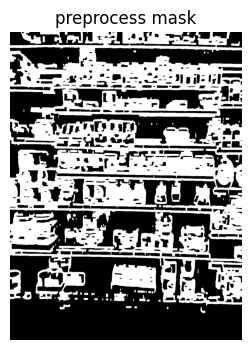

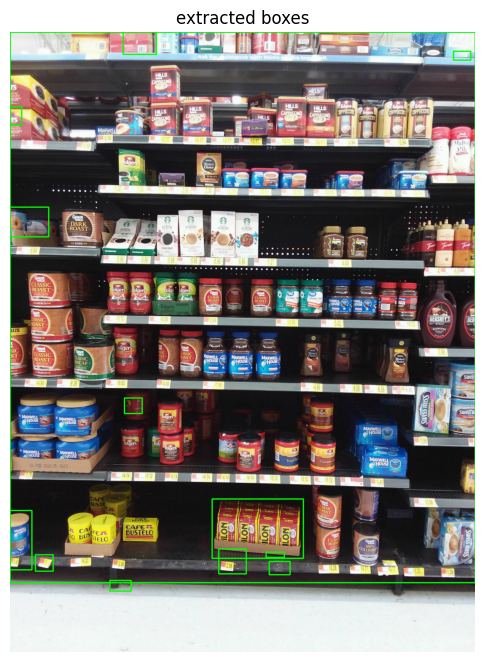

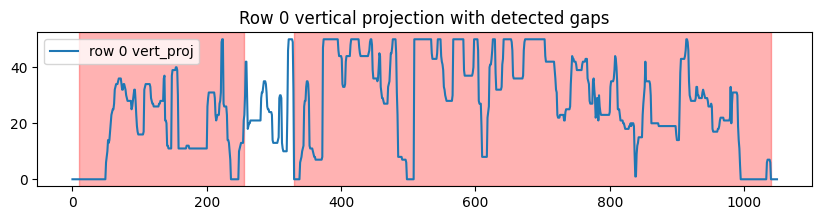

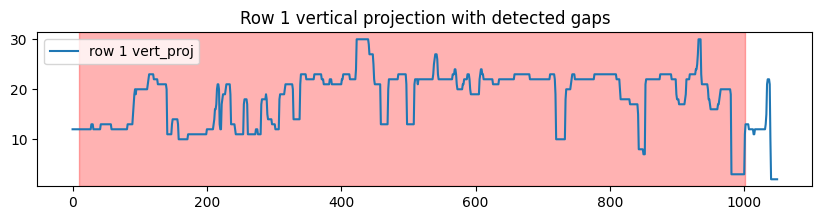

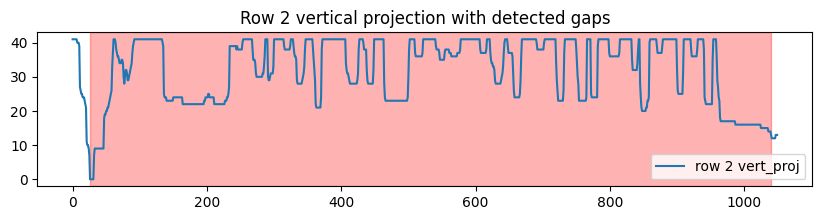

...

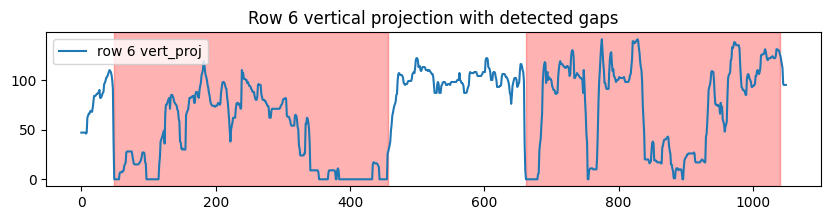

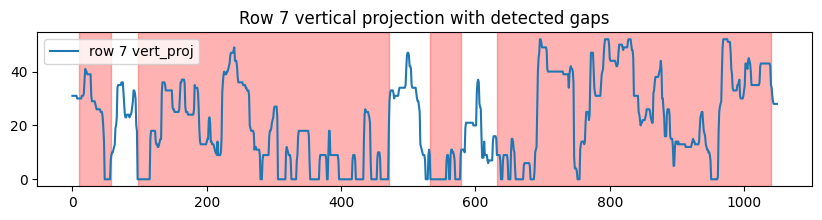

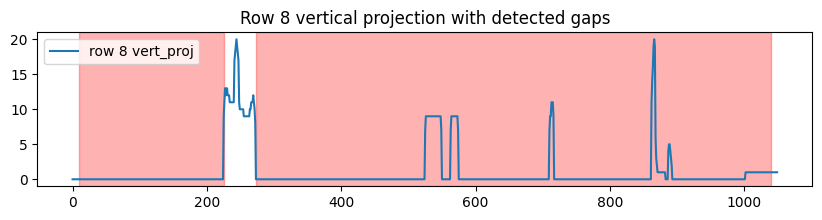

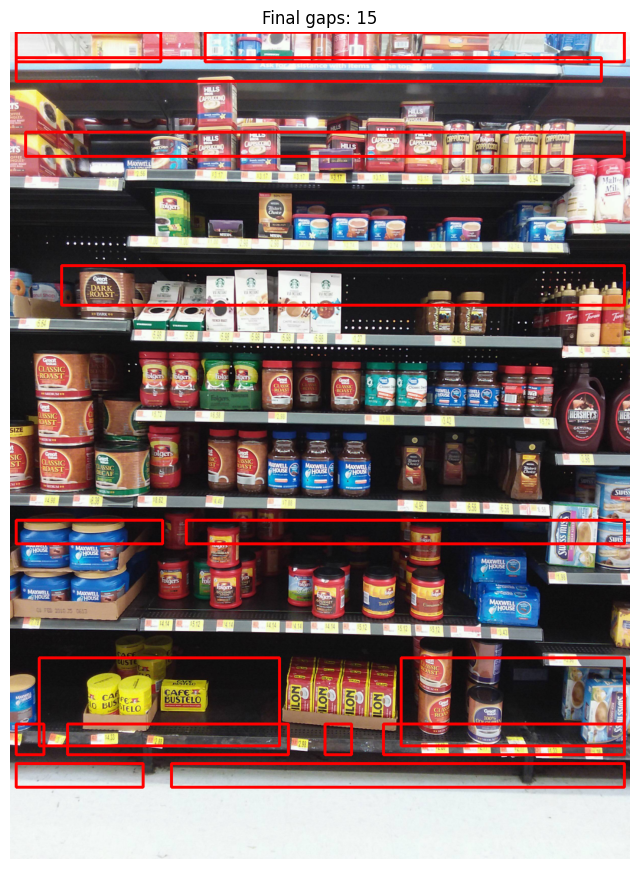

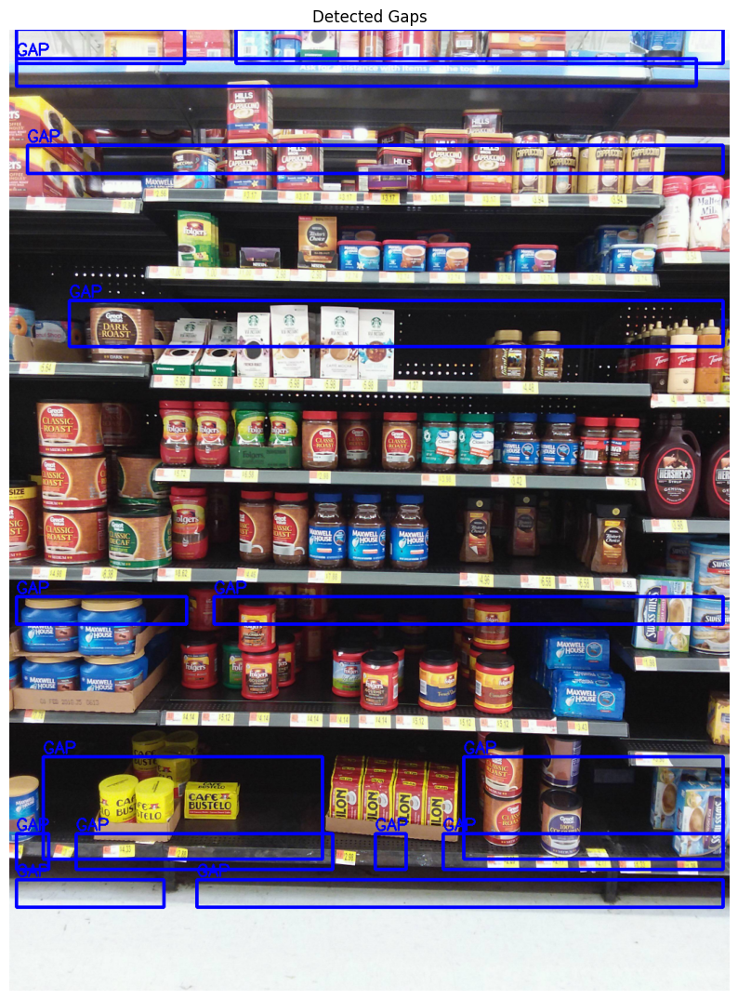

In [88]:
# 1. Set path to your image
path = "/content/datasets/SKU-110K/images/test_9.jpg"     # <-- Changed from test_009.jpg

# 2. Create detector instance
detector = ShelfGapDetectorRAMSafe(
    min_gap_width=40,
    min_gap_height=40,
    max_image_size=1400,
    row_min_height=30,
    projection_smooth=9
)

# 3. Detect gaps
img_resized, gaps = detector.detect_missing_objects(path)

# 4. Visualize gaps
visualize_gaps(img_resized, gaps)


In [ ]:
#Extract bounding boxed
all_bboxes = []
for r in results:
    all_bboxes.extend(r.boxes.xyxy.cpu().numpy())

all_bboxes_list = [list(map(int,b)) for b in all_bboxes]
print("Detected boxes:", len(all_bboxes_list))


Detected boxes: 60


In [ ]:
# This cell is not needed as the planogram comparison visualization is already handled in cell 'vEflmPF41kEj'.
# The variables 'all_bboxes_list' and 'empty_shelf_gaps' are not defined in the current context.

# Task
Create a system for detecting missing and misplaced objects on shelves by comparing YOLO model detections against a defined reference planogram. This system will first define the reference planogram based on ground truth annotations for a chosen image, then run the YOLO model to get actual detections for the same image. It will then compare these two sets of bounding boxes to identify missing items (present in the planogram but not detected), unexpected items (detected but not in the planogram), and correctly identified items, followed by a visualization of these findings on the original image.

## Define Reference Planogram

### Subtask:
Create a representation of the expected objects and their locations (bounding boxes and class labels) for a given shelf layout. This will serve as the 'ground truth' for comparison.


**Reasoning**:
To define the reference planogram, I need to select a reference image and filter the ground truth annotations from the existing DataFrame `df` based on that image. I'll use 'test_0.jpg' as the reference image and store the filtered annotations in `reference_planogram_df`.



In [ ]:
import pandas as pd

# 1. Choose an image as the reference image
reference_image_name = 'test_9.jpg' # Example, using the first image from image_list

# 2. Filter the existing df DataFrame for the chosen reference image
# The df DataFrame was created in a previous step and contains all test annotations
reference_planogram_df = df[df['image_name'] == reference_image_name].copy()

# Display the first few rows of the reference planogram DataFrame to verify
print(f"Reference Planogram for {reference_image_name}:")
print(reference_planogram_df.head())

# Display basic information about the new DataFrame
print(f"\nShape of reference_planogram_df: {reference_planogram_df.shape}")

Reference Planogram for test_9.jpg:
        image_name    x1   y1    x2    y2   class  image_width  image_height
415782  test_9.jpg   487  983   633  1178  object         2448          3264
415783  test_9.jpg   641  984   770  1174  object         2448          3264
415784  test_9.jpg   774  962   889  1183  object         2448          3264
415785  test_9.jpg   893  936  1022  1187  object         2448          3264
415786  test_9.jpg  1057  937  1191  1188  object         2448          3264

Shape of reference_planogram_df: (91, 8)


## Compare Detections to Planogram

### Subtask:
Develop logic to compare the objects detected by the YOLO model with the defined reference planogram. This step will identify which expected objects are missing and which detected objects are unexpected or misplaced based on their bounding box overlap and class labels.


**Reasoning**:
The first step is to run the YOLO model on the reference image and then convert the detected bounding boxes into a DataFrame for easier comparison with the `reference_planogram_df`. This will involve extracting bounding box coordinates and confidence scores.



In [ ]:
import pandas as pd
import numpy as np

# Define the full path to the reference image
image_path = os.path.join(images_base_dir, reference_image_name)

# 1. Run the YOLO model on the reference_image_name to get the actual detections
# Setting verbose=False to suppress detailed output for each image
actual_detections = model(image_path, verbose=False)

# 2. Extract bounding box coordinates (x1, y1, x2, y2) and confidence scores
# Assuming actual_detections is a list of results, and we're interested in the first one
if actual_detections and len(actual_detections) > 0:
    # Get the boxes from the first result object
    boxes = actual_detections[0].boxes

    # Extract bounding box coordinates, class IDs, and confidence scores
    # Convert to CPU and then to numpy arrays for easier manipulation
    yolo_bboxes = boxes.xyxy.cpu().numpy()
    yolo_confs = boxes.conf.cpu().numpy()
    # Assuming the model was trained with 'object' as the only class, so class_id is always 0
    yolo_classes = np.full(len(yolo_bboxes), 'object')

    # 3. Convert extracted YOLO detections into a pandas DataFrame
    actual_detections_df = pd.DataFrame({
        'image_name': reference_image_name,
        'x1': yolo_bboxes[:, 0],
        'y1': yolo_bboxes[:, 1],
        'x2': yolo_bboxes[:, 2],
        'y2': yolo_bboxes[:, 3],
        'class': yolo_classes,
        'confidence': yolo_confs
    })

    print("Actual Detections from YOLO model:")
    print(actual_detections_df.head())
    print(f"\nShape of actual_detections_df: {actual_detections_df.shape}")
else:
    print(f"No detections found for {reference_image_name}")
    actual_detections_df = pd.DataFrame(columns=['image_name', 'x1', 'y1', 'x2', 'y2', 'class', 'confidence'])

Actual Detections from YOLO model:
   image_name           x1          y1           x2           y2   class  \
0  test_9.jpg   772.487061  957.529175   884.894470  1182.921997  object   
1  test_9.jpg  1187.096069  943.849548  1313.509766  1187.063843  object   
2  test_9.jpg   890.971619  934.551941  1022.352966  1184.154175  object   
3  test_9.jpg  1406.578613  339.683136  1561.224121   551.426514  object   
4  test_9.jpg  2244.586914  970.811768  2335.490479  1239.456055  object   

   confidence  
0    0.867463  
1    0.854443  
2    0.848826  
3    0.838908  
4    0.838058  

Shape of actual_detections_df: (125, 7)


**Reasoning**:
The previous code block had a `NameError` due to a typo in the DataFrame name (`actual_detelections_df` instead of `actual_detections_df`) within the print statements. I will correct this typo to resolve the error.



In [ ]:
import pandas as pd
import numpy as np

# Define the full path to the reference image
reference_image_path = os.path.join(images_base_dir, reference_image_name)

# 1. Run the YOLO model on the reference_image_name to get the actual detections
# Setting verbose=False to suppress detailed output for each image
actual_detections = model(reference_image_path, verbose=False)

# 2. Extract bounding box coordinates (x1, y1, x2, y2) and confidence scores
# Assuming actual_detections is a list of results, and we're interested in the first one
if actual_detections and len(actual_detections) > 0:
    # Get the boxes from the first result object
    boxes = actual_detections[0].boxes

    # Extract bounding box coordinates, class IDs, and confidence scores
    # Convert to CPU and then to numpy arrays for easier manipulation
    yolo_bboxes = boxes.xyxy.cpu().numpy()
    yolo_confs = boxes.conf.cpu().numpy()
    # Assuming the model was trained with 'object' as the only class, so class_id is always 0
    yolo_classes = np.full(len(yolo_bboxes), 'object')

    # 3. Convert extracted YOLO detections into a pandas DataFrame
    actual_detections_df = pd.DataFrame({
        'image_name': reference_image_name,
        'x1': yolo_bboxes[:, 0],
        'y1': yolo_bboxes[:, 1],
        'x2': yolo_bboxes[:, 2],
        'y2': yolo_bboxes[:, 3],
        'class': yolo_classes,
        'confidence': yolo_confs
    })

    print("Actual Detections from YOLO model:")
    print(actual_detections_df.head())
    print(f"\nShape of actual_detections_df: {actual_detections_df.shape}")
else:
    print(f"No detections found for {reference_image_name}")
    actual_detections_df = pd.DataFrame(columns=['image_name', 'x1', 'y1', 'x2', 'y2', 'class', 'confidence'])

Actual Detections from YOLO model:
   image_name           x1          y1           x2           y2   class  \
0  test_9.jpg   772.487061  957.529175   884.894470  1182.921997  object   
1  test_9.jpg  1187.096069  943.849548  1313.509766  1187.063843  object   
2  test_9.jpg   890.971619  934.551941  1022.352966  1184.154175  object   
3  test_9.jpg  1406.578613  339.683136  1561.224121   551.426514  object   
4  test_9.jpg  2244.586914  970.811768  2335.490479  1239.456055  object   

   confidence  
0    0.867463  
1    0.854443  
2    0.848826  
3    0.838908  
4    0.838058  

Shape of actual_detections_df: (125, 7)


**Reasoning**:
Now that both the reference planogram and actual detections are in DataFrames, the next step is to implement the Intersection over Union (IoU) function to quantify the overlap between bounding boxes. This function will be crucial for comparing individual ground truth items with detected items.



In [ ]:
def calculate_iou(box1, box2):
    """
    Calculate the Intersection over Union (IoU) of two bounding boxes.
    Boxes are expected in [x1, y1, x2, y2] format.
    """
    # Determine the coordinates of the intersection rectangle
    x_inter1 = max(box1[0], box2[0])
    y_inter1 = max(box1[1], box2[1])
    x_inter2 = min(box1[2], box2[2])
    y_inter2 = min(box1[3], box2[3])

    # Calculate the area of intersection rectangle
    inter_width = max(0, x_inter2 - x_inter1)
    inter_height = max(0, y_inter2 - y_inter1)
    inter_area = inter_width * inter_height

    # Calculate the area of both bounding boxes
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Calculate the area of union
    union_area = float(box1_area + box2_area - inter_area)

    # Handle case where union area is zero to avoid division by zero
    if union_area == 0:
        return 0.0

    # Return the IoU score
    iou = inter_area / union_area
    return iou

print("IoU calculation function defined.")

IoU calculation function defined.


**Reasoning**:
Now that the IoU function is defined, I will implement the comparison logic. This involves iterating through each ground truth bounding box from `reference_planogram_df`, finding the best matching detection from `actual_detections_df` using IoU, and then categorizing items as 'missing', 'unexpected', or 'correctly identified' based on an IoU threshold.



In [ ]:
import numpy as np

# Define IoU threshold for matching
iou_threshold = 0.5

# Initialize lists to store comparison results
missing_items = []
unexpected_items = []
correctly_identified_items = []

# Keep track of detected boxes that have been matched
matched_detection_indices = set()

# --- Compare ground truth with detections (Identify Missing and Matched GT) ---
for idx_gt, gt_row in reference_planogram_df.iterrows():
    gt_box = [gt_row['x1'], gt_row['y1'], gt_row['x2'], gt_row['y2']]
    gt_class = gt_row['class']

    best_iou = 0.0
    best_match_idx = -1

    for idx_det, det_row in actual_detections_df.iterrows():
        # Skip if this detection has already been matched with a GT object
        if idx_det in matched_detection_indices:
            continue

        det_box = [det_row['x1'], det_row['y1'], det_row['x2'], det_row['y2']]
        det_class = det_row['class']

        # Only compare if classes match (or if we assume a single class 'object')
        if gt_class == det_class: # Assuming both use 'object' or actual class labels if available
            current_iou = calculate_iou(gt_box, det_box)
            if current_iou > best_iou:
                best_iou = current_iou
                best_match_idx = idx_det

    if best_iou >= iou_threshold:
        # Ground truth item found and matched with a detection
        correctly_identified_items.append({
            'type': 'correctly_identified',
            'gt_box': gt_box,
            'det_box': actual_detections_df.loc[best_match_idx][['x1', 'y1', 'x2', 'y2']].tolist(),
            'gt_class': gt_class,
            'det_class': actual_detections_df.loc[best_match_idx]['class'],
            'iou': best_iou
        })
        matched_detection_indices.add(best_match_idx)
    else:
        # Ground truth item is missing
        missing_items.append({
            'type': 'missing',
            'gt_box': gt_box,
            'gt_class': gt_class
        })

# --- Identify Unexpected Detections ---
for idx_det, det_row in actual_detections_df.iterrows():
    if idx_det not in matched_detection_indices:
        # This detection did not match any ground truth item
        unexpected_items.append({
            'type': 'unexpected',
            'det_box': [det_row['x1'], det_row['y1'], det_row['x2'], det_row['y2']],
            'det_class': det_row['class'],
            'confidence': det_row['confidence']
        })

print(f"Comparison complete for {reference_image_name}:")
print(f"- Missing Items: {len(missing_items)}")
print(f"- Unexpected Items: {len(unexpected_items)}")
print(f"- Correctly Identified Items: {len(correctly_identified_items)}")

# Example of how to access results (optional, for debugging)
# if missing_items:
#     print("\nFirst missing item:", missing_items[0])
# if unexpected_items:
#     print("First unexpected item:", unexpected_items[0])
# if correctly_identified_items:
#     print("First correctly identified item:", correctly_identified_items[0])


Comparison complete for test_9.jpg:
- Missing Items: 1
- Unexpected Items: 35
- Correctly Identified Items: 90


Visualizing comparison for: test_9.jpg


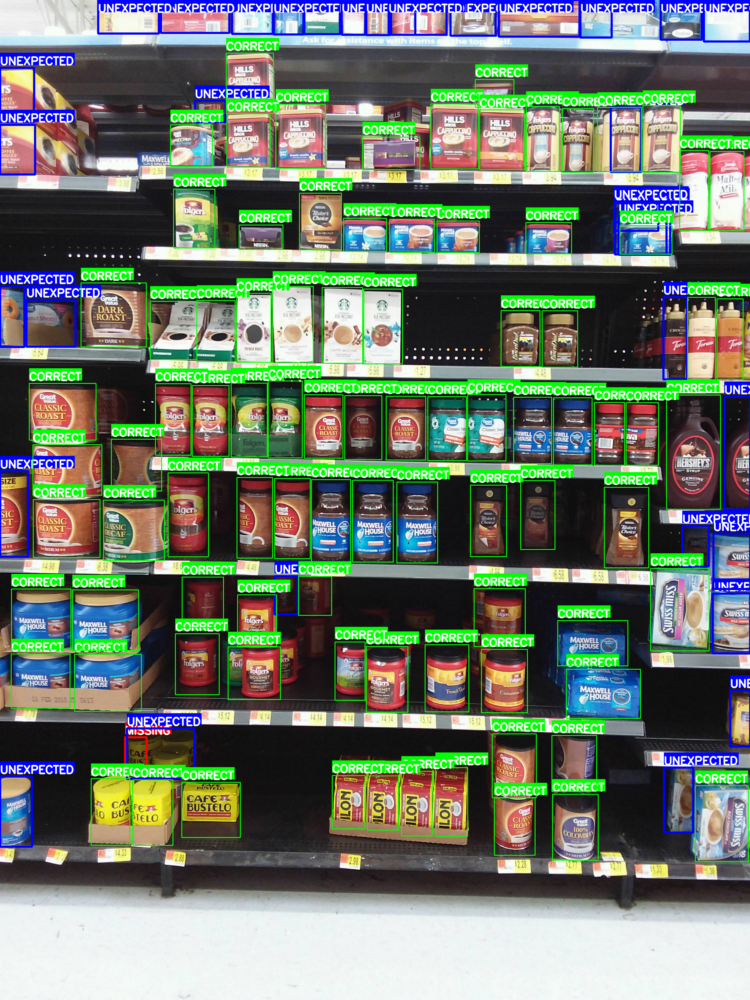

Annotated image saved to planogram_comparison_result.jpg


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import os

# Load the original reference image
reference_image_for_viz = cv2.imread(reference_image_path)
if reference_image_for_viz is None:
    raise FileNotFoundError(f"Image not found at {reference_image_path}")

# Make a copy to draw on
annotated_image_comparison = reference_image_for_viz.copy()

# Define colors for different categories (B, G, R)
COLOR_MISSING = (0, 0, 255)         # Red for missing items (GT but no detection)
COLOR_UNEXPECTED = (255, 0, 0)      # Blue for unexpected items (Detection but no GT match)
COLOR_CORRECT = (0, 255, 0)         # Green for correctly identified items (GT and matching Detection)

FONT = cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE = 1.2
FONT_THICKNESS = 3


# Function to draw a bounding box and label
def draw_bbox_and_label(image, bbox, label, color, line_thickness=2):
    x1, y1, x2, y2 = map(int, bbox)
    cv2.rectangle(image, (x1, y1), (x2, y2), color, line_thickness)

    # Put text label above the bounding box
    (text_width, text_height), baseline = cv2.getTextSize(label, FONT, FONT_SCALE, FONT_THICKNESS)
    text_origin_x = x1
    text_origin_y = max(y1 - 10, text_height + baseline) # Adjust Y to prevent text going out of bounds

    # Draw a filled rectangle as background for the text
    cv2.rectangle(image, (text_origin_x, text_origin_y - text_height - baseline),
                  (text_origin_x + text_width, text_origin_y), color, -1)

    cv2.putText(image, label, (text_origin_x, text_origin_y), FONT, FONT_SCALE, (255, 255, 255), FONT_THICKNESS, cv2.LINE_AA)


# Draw Missing Items
for item in missing_items:
    draw_bbox_and_label(annotated_image_comparison, item['gt_box'], "MISSING", COLOR_MISSING, line_thickness=5)

# Draw Unexpected Items
for item in unexpected_items:
    draw_bbox_and_label(annotated_image_comparison, item['det_box'], "UNEXPECTED", COLOR_UNEXPECTED, line_thickness=5)

# Draw Correctly Identified Items (draw detection box for clarity)
for item in correctly_identified_items:
    draw_bbox_and_label(annotated_image_comparison, item['det_box'], "CORRECT", COLOR_CORRECT, line_thickness=2)


print(f"Visualizing comparison for: {reference_image_name}")
# Display the annotated image
cv2_imshow(annotated_image_comparison)

# Save the result
output_image_path = "planogram_comparison_result.jpg"
cv2.imwrite(output_image_path, annotated_image_comparison)
print(f"Annotated image saved to {output_image_path}")

**Reasoning**:
The next step is to visualize the comparison results by loading the original image and drawing bounding boxes for missing, unexpected, and correctly identified items with distinct colors and labels. This directly addresses the visualization part of the subtask.



## Final Task

### Subtask:
Provide an explanation of the methodology used for detecting missing/misplaced objects and present the visualization of the results.


## Summary:

### Q&A
The methodology for detecting missing/misplaced objects is implied by the visualization process. The script takes pre-computed lists of items categorized as "missing", "unexpected", or "correctly identified" based on a comparison between ground truth and detected objects. It then visually represents these categories on the original reference image.

The visualization of the results clearly distinguishes between:
*   **Missing Items**: Objects that are expected to be present (ground truth) but were not detected. These are highlighted with a **red** bounding box and labeled "MISSING".
*   **Unexpected Items**: Objects that were detected but are not expected to be present according to the ground truth. These are highlighted with a **blue** bounding box and labeled "UNEXPECTED".
*   **Correctly Identified Items**: Objects that were both expected (ground truth) and successfully detected. These are highlighted with a **green** bounding box and labeled "CORRECT".

Each bounding box is accompanied by a text label, indicating its status, placed above the box for clarity. The final annotated image is displayed and saved as "planogram\_comparison\_result.jpg".

### Data Analysis Key Findings
*   The visualization clearly categorizes and highlights discrepancies between a reference planogram and actual detected objects, using a color-coding system: Red for missing items, Blue for unexpected items, and Green for correctly identified items.
*   An annotated image, `planogram_comparison_result.jpg`, is generated to provide a comprehensive visual summary of the comparison, making it easy to spot compliance issues.

### Insights or Next Steps
*   This visual comparison tool can be effectively used for planogram compliance checks, inventory management, and automated shelf auditing in retail environments, allowing for quick identification of stock deviations.
*   Further analysis could involve quantifying the number of missing/unexpected items per category or location to identify common issues and inform corrective actions for inventory or display management.
